In [325]:
library( tidyverse )
library( highcharter )
library( knitr )
library( pander )
library( tidyverse )
library( ggplot2 )
library( doBy )
library( xtable )
library( ggthemes )
library( kableExtra )
library( viridis )
library( DiagrammeR )
library( magrittr )
library( RColorBrewer )
library(webshot)
library(hash)
library( miceadds )
library(zoo)
library(dplyr)
library(caret)
library(chron)
library(moments)

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

In [326]:
load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [327]:
dim(df)

[1] 1147 1874

Selezione delle variabili di interesse

In [328]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps","leastOneEpathenal",
           "leastOneSpontaneousBacterial","thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "scoreCHILD","organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

Sistemo variabili a scelta multipla o quelle subordinate alla selezione di una variabile precedente andando ad inserire il valore 0 al posto di NaN

In [329]:
listsub <- c("tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht", "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter")

In [330]:

listLivDis<-c("liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease")




In [331]:
fix_multi <- function(dati,lista){

   for (i in lista){
      levels(dati[[i]]) <- c(levels(dati[[i]]),0)
      dati[[i]][is.na(dati[[i]])] <- 0
   }

   return(dati)
}


In [332]:
#fill NA with 0 for pop up variables and multi choice vriables
df <- fix_multi(df, listLivDis)

In [333]:
df <- fix_multi(df,listsub)

In [334]:
dim(df)

[1] 1147  125

# Data exploration

Inizia la fase di esplorazione dei dati in cui per prima cosa vedo come è fatto il dataset

In [335]:
rownames(df) <- NULL
head(df)

patientKey,icuAdmDate__icuAdmDate,icuAdmDate__icuAdmTime,centreCode,genderClear,age,degenzaPreTra,admWard_RIC_PED,typeStatus_RIC,pulmonarHypertension,...,comorbidities_cerDis_RIC,comorbidities_hemiParaQuadr_RIC,comorbidities_neuro_RIC,comorbidities_modRenal_RIC,comorbidities_diab1_RIC,comorbidities_diab2NoIns_RIC,comorbidities_diab2Ins_RIC,comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC,comorbidities_severePsychosis_RIC
P-IT126-4729,2018-10-23,15:20,IT126,Male,48,1,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4090,2018-10-29,15:22,IT126,Male,19,42,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4831,2018-12-29,19:10,IT126,Male,67,9,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4855,2018-12-25,14:28,IT126,Male,54,3,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4870,2018-12-24,14:18,IT126,Male,59,1,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4871,2018-12-25,19:38,IT126,Female,69,0,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,1,0,0,0,0


Vedo struttura dataset, le informazioni generali che si ottengono sono numero righe e numero colonne, poi per ogni variabile viene indicato il tipo e se la variabile è categorica il numero di livelli

In [336]:
str(df)

'data.frame':	1147 obs. of  125 variables:
 $ patientKey                           : chr  "P-IT126-4729" "P-IT126-4090" "P-IT126-4831" "P-IT126-4855" ...
 $ icuAdmDate__icuAdmDate               : Date, format: "2018-10-23" "2018-10-29" ...
 $ icuAdmDate__icuAdmTime               : chr  "15:20" "15:22" "19:10" "14:28" ...
 $ centreCode                           : chr  "IT126" "IT126" "IT126" "IT126" ...
 $ genderClear                          : Factor w/ 2 levels "Male","Female": 1 1 1 1 1 2 2 1 1 2 ...
 $ age                                  : num  48 19 67 54 59 69 49 49 53 57 ...
 $ degenzaPreTra                        : num  1 42 9 3 1 0 31 64 1 1 ...
 $ admWard_RIC_PED                      : Factor w/ 6 levels "medicalWard",..: 1 1 1 1 1 1 2 4 2 2 ...
 $ typeStatus_RIC                       : Factor w/ 3 levels "nonSurgical",..: 3 3 3 3 3 3 1 1 3 3 ...
 $ pulmonarHypertension                 : Factor w/ 2 levels "responsNo","responsYes": 1 1 1 1 1 1 1 1 1 1 ...
 $ epatopulmonarSynd

Viene data una sintesi del dataset, le informazioni per le variabili continue sono: valore minimo, primo quartile, mediana, media, terzo quartile e valore massimo. Per le variabili categoriche viene detto quanti valori ci sono per ogni livello

In [337]:
summary(df)

  patientKey        icuAdmDate__icuAdmDate icuAdmDate__icuAdmTime
 Length:1147        Min.   :2018-09-26     Length:1147           
 Class :character   1st Qu.:2019-11-22     Class :character      
 Mode  :character   Median :2020-08-26     Mode  :character      
                    Mean   :2020-08-06                           
                    3rd Qu.:2021-05-04                           
                    Max.   :2021-12-31                           
                                                                 
  centreCode        genderClear       age        degenzaPreTra    
 Length:1147        Male  :811   Min.   :14.00   Min.   :  0.000  
 Class :character   Female:336   1st Qu.:52.00   1st Qu.:  0.000  
 Mode  :character                Median :58.00   Median :  1.000  
                                 Mean   :56.24   Mean   :  5.995  
                                 3rd Qu.:63.00   3rd Qu.:  2.000  
                                 Max.   :75.00   Max.   :304.000  
   

Ulteriori informazioni sul dataset, numero totale per tipologia di variabile e alcune informazioni sui missing value

In [338]:
library(DataExplorer)
introduce(data = df)

rows,columns,discrete_columns,continuous_columns,all_missing_columns,total_missing_values,complete_rows,total_observations,memory_usage
1147,125,94,31,0,1304,744,143375,910728


In [339]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,90
numeric,31


Panoramica descrittiva fatta con boxplot di tutte le variabili continue per capire gli outliers

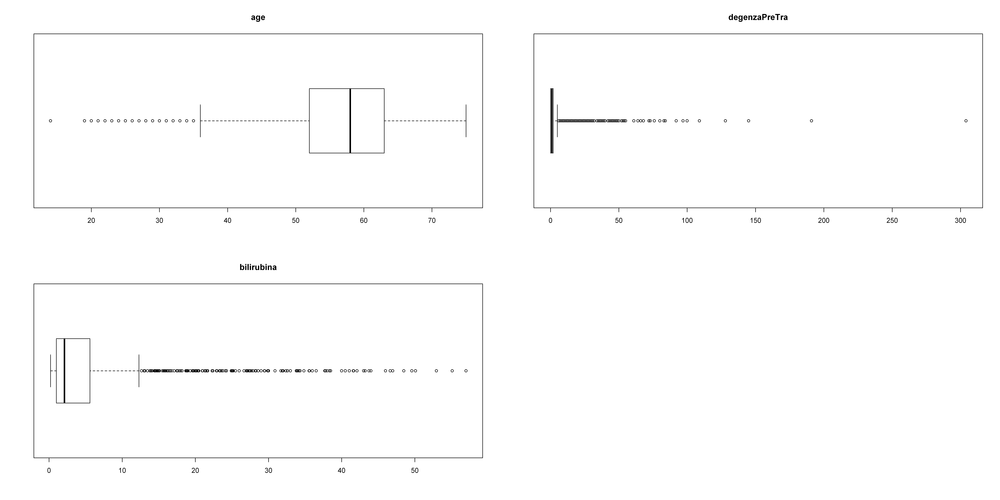

In [340]:
par(mfrow=c(2,2))

boxplot(df$age, horizontal = T, main="age")

boxplot(df$degenzaPreTra,horizontal = T,main="degenzaPreTra")


boxplot(df$bilirubinaTotale,horizontal = T, main="bilirubina")

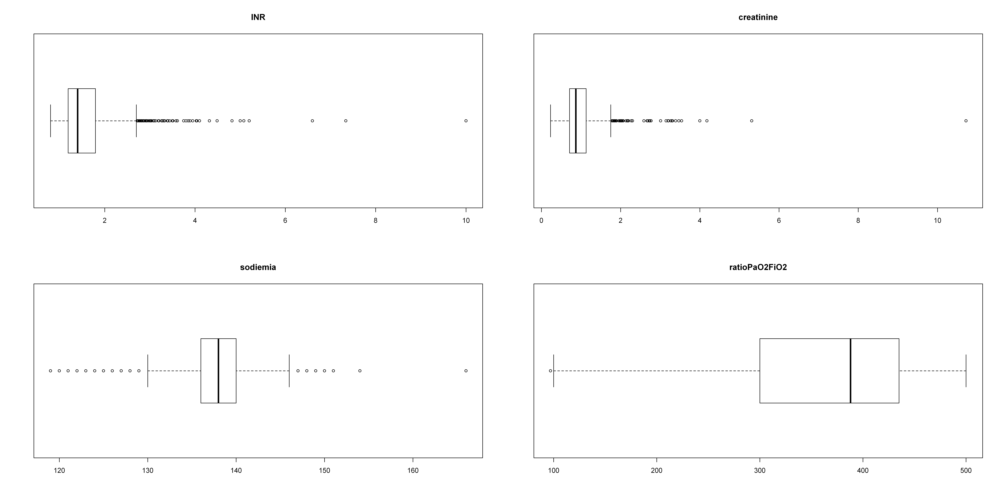

In [341]:
par(mfrow=c(2,2))

boxplot(df$INR,horizontal = T,main="INR")

boxplot(df$serumCreatinine,horizontal = T,main="creatinine")

boxplot(df$Sodiemia,horizontal = T,main="sodiemia")

boxplot(df$ratioPaO2FiO2,horizontal = T, main="ratioPaO2FiO2")

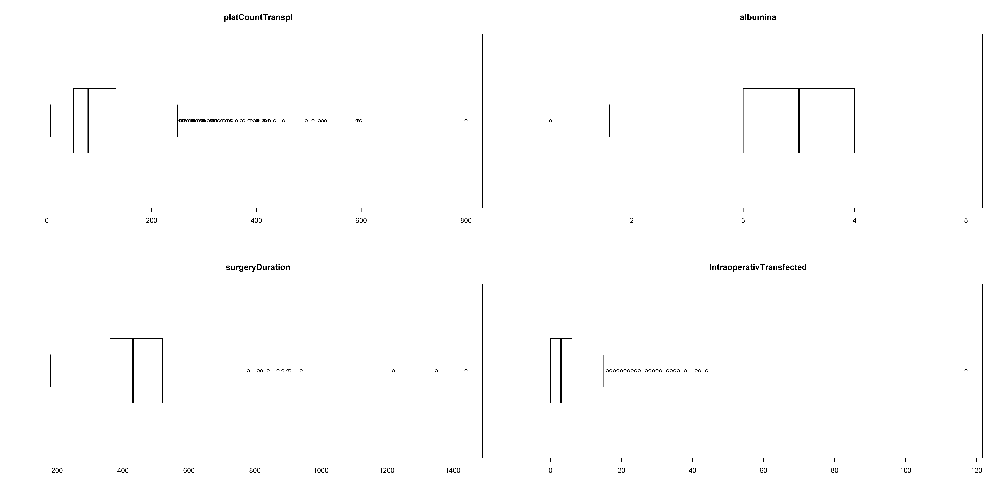

In [342]:
par(mfrow=c(2,2))

boxplot(df$platCountTranspl,horizontal = T,main="platCountTranspl")

boxplot(df$albumina,horizontal = T,main="albumina")

boxplot(df$surgeryDuration,horizontal = T,main="surgeryDuration")

boxplot(df$IntraoperativTransfected,horizontal = T, main="IntraoperativTransfected")

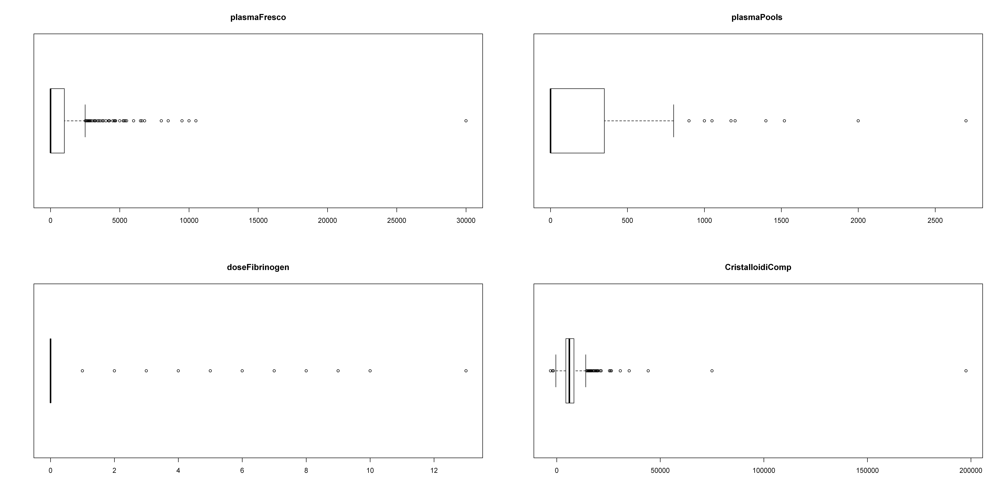

In [343]:
par(mfrow=c(2,2))

boxplot(df$plasmaFresco,horizontal = T,main="plasmaFresco")

boxplot(df$plasmaPools,horizontal = T,main="plasmaPools ")

boxplot(df$doseFibrinogen,horizontal = T,main="doseFibrinogen")

boxplot(df$CristalloidiComp,horizontal = T, main="CristalloidiComp")

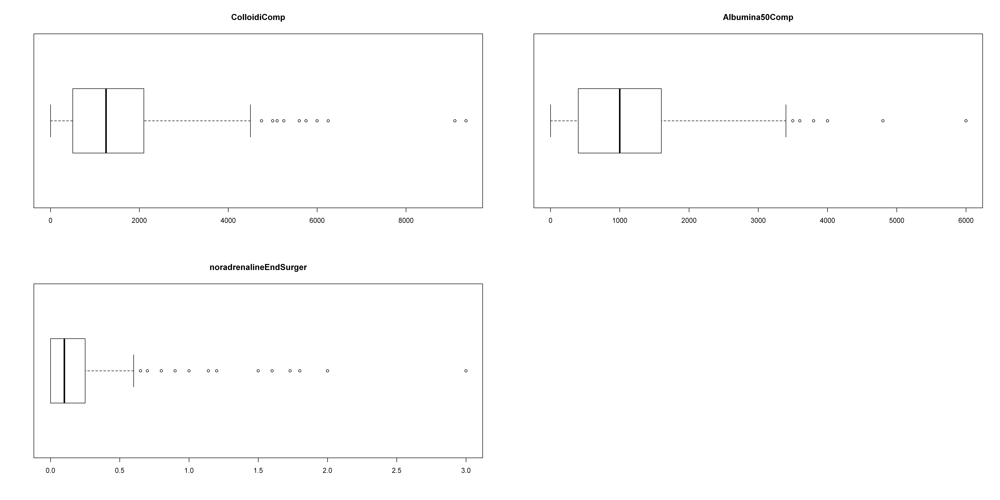

In [344]:
par(mfrow=c(2,2))

boxplot(df$ColloidiComp,horizontal = T,main="ColloidiComp")

boxplot(df$Albumina50Comp,horizontal = T,main="Albumina50Comp")


boxplot(df$noradrenalineEndSurger,horizontal = T, main="noradrenalineEndSurger")

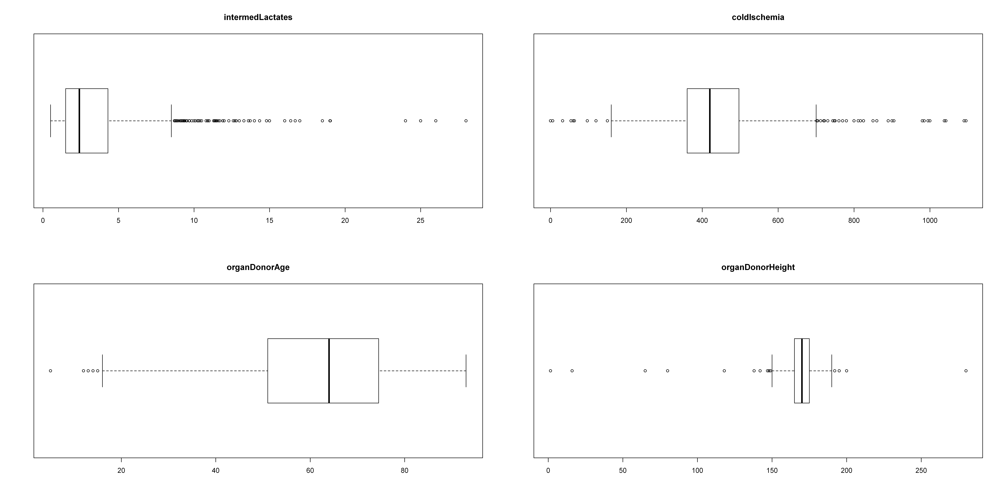

In [345]:
par(mfrow=c(2,2))

boxplot(df$intermedLactates,horizontal = T,main="intermedLactates")

boxplot(df$coldIschemia,horizontal = T,main="coldIschemia")

boxplot(df$organDonorAge,horizontal = T,main="organDonorAge")

boxplot(df$organDonorHeight,horizontal = T, main="organDonorHeight")

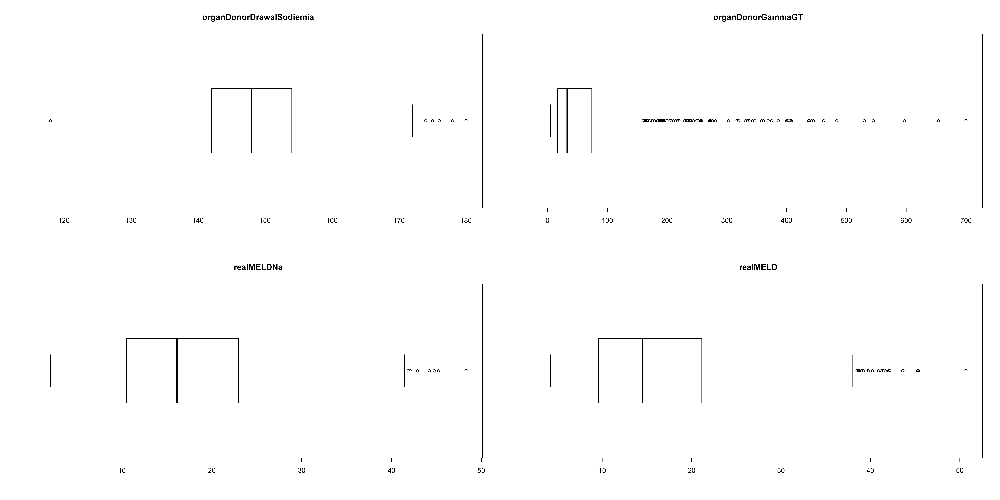

In [346]:
par(mfrow=c(2,2))

boxplot(df$organDonorDrawalSodiemia,horizontal = T,main="organDonorDrawalSodiemia")

boxplot(df$organDonorGammaGT,horizontal = T,main="organDonorGammaGT")

boxplot(df$realMELDNa,horizontal = T,main="realMELDNa")

boxplot(df$realMELD, horizontal = T,main="realMELD")

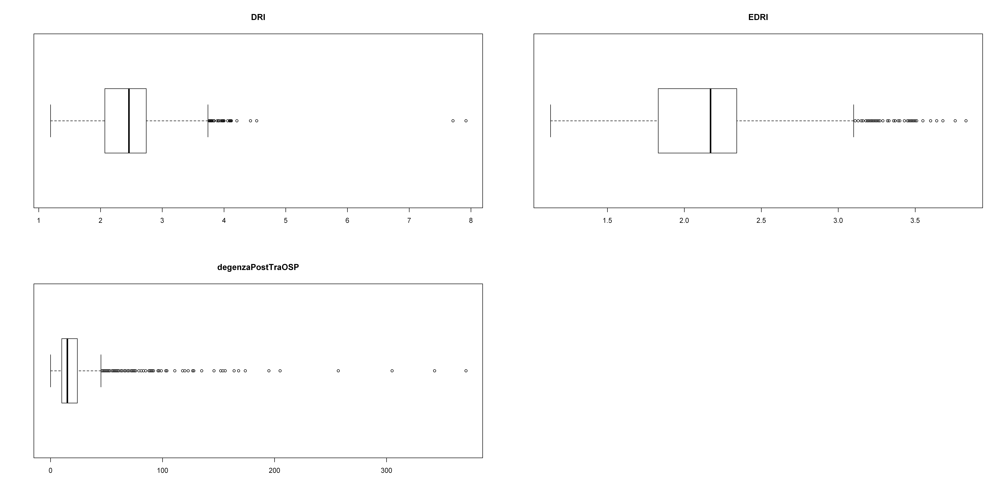

In [347]:
par(mfrow=c(2,2))

boxplot(df$DRI,horizontal = T,main="DRI")

boxplot(df$EDRI,horizontal = T,main="EDRI")

boxplot(df$degenzaPostTraOSP,horizontal = T,main="degenzaPostTraOSP")

Panoramica descrittiva su variabili categoriche con barplot

3 columns ignored with more than 50 categories.
patientKey: 1138 categories
icuAdmDate__icuAdmDate: 719 categories
icuAdmDate__icuAdmTime: 431 categories




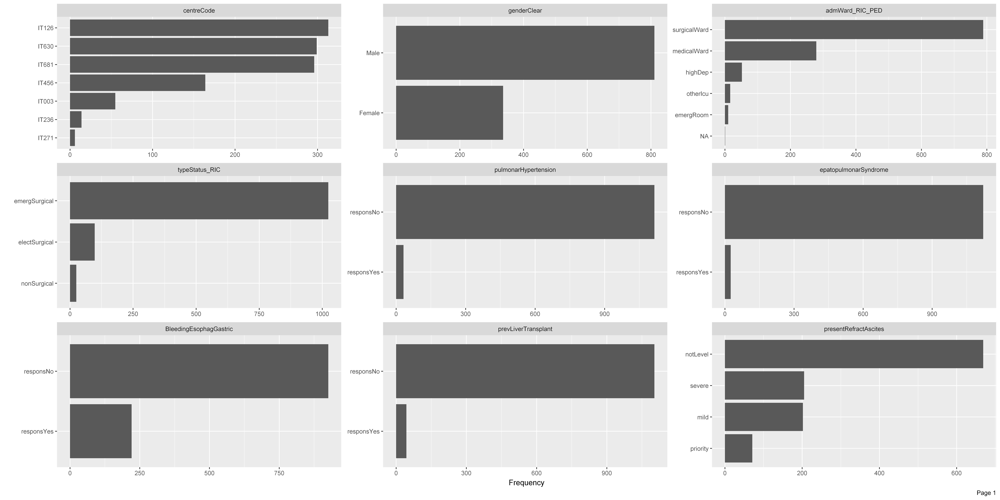

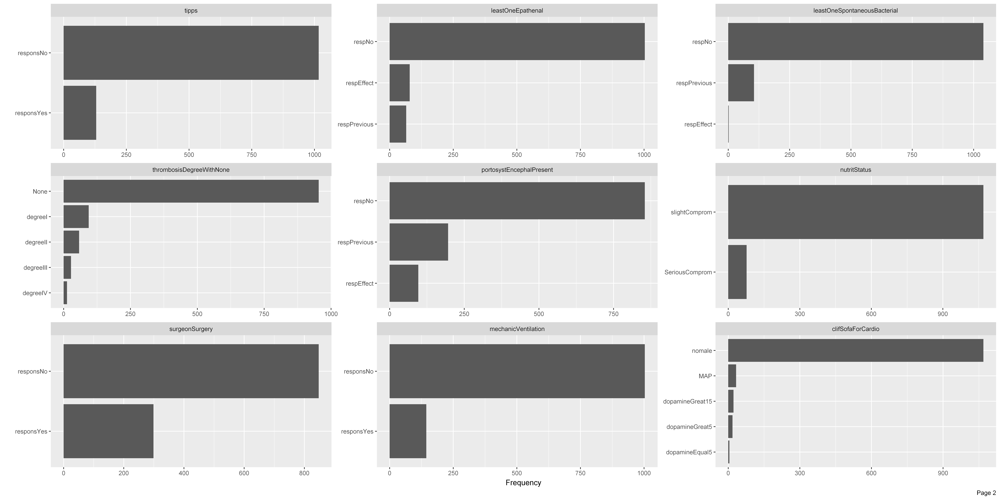

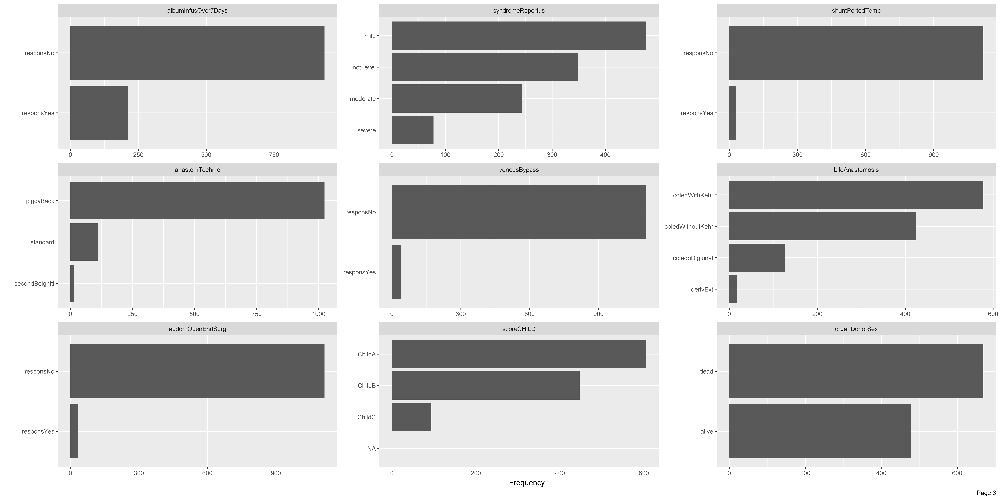

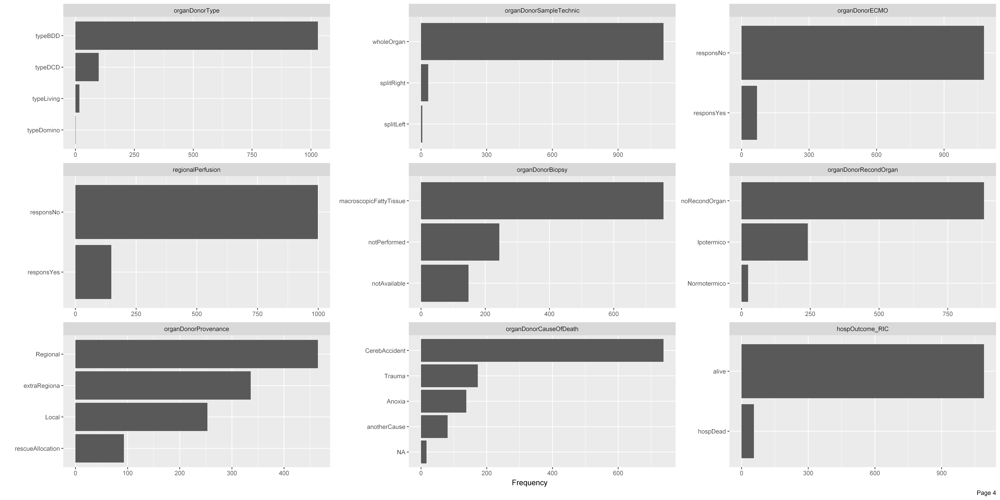

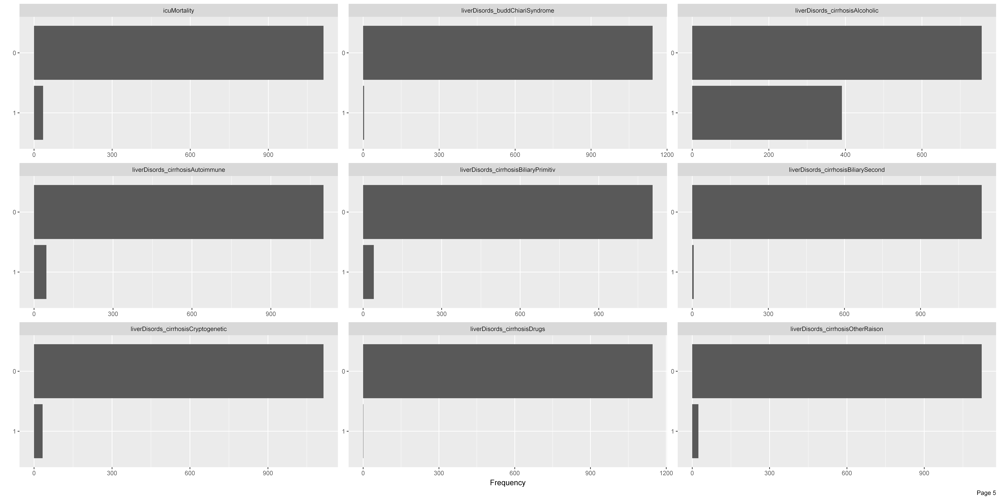

...

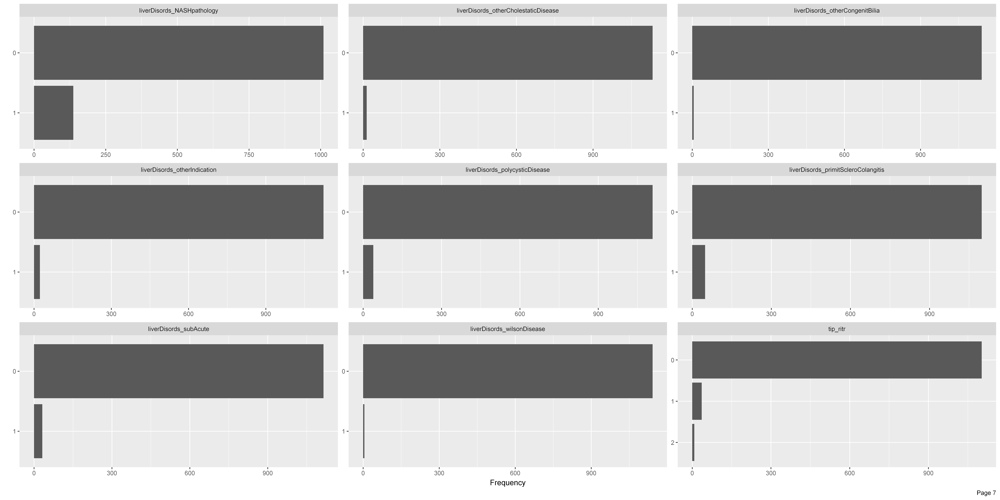

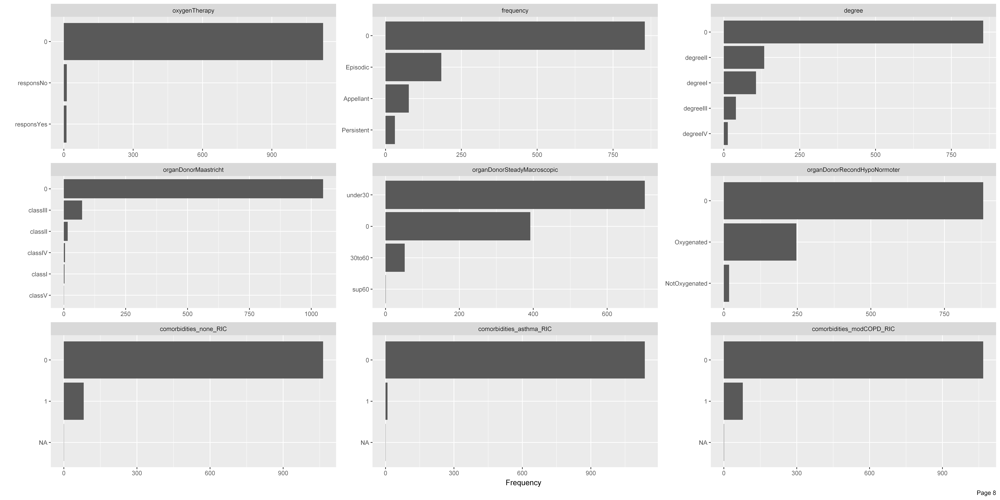

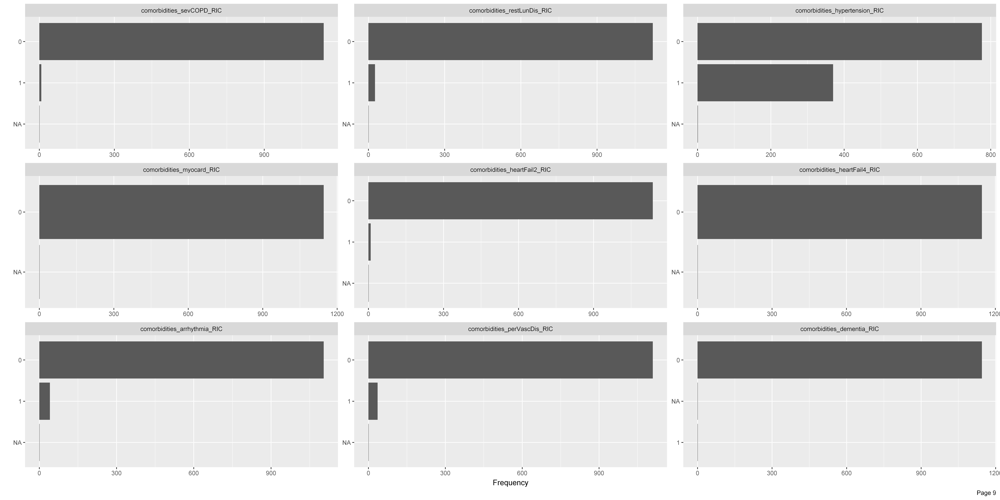

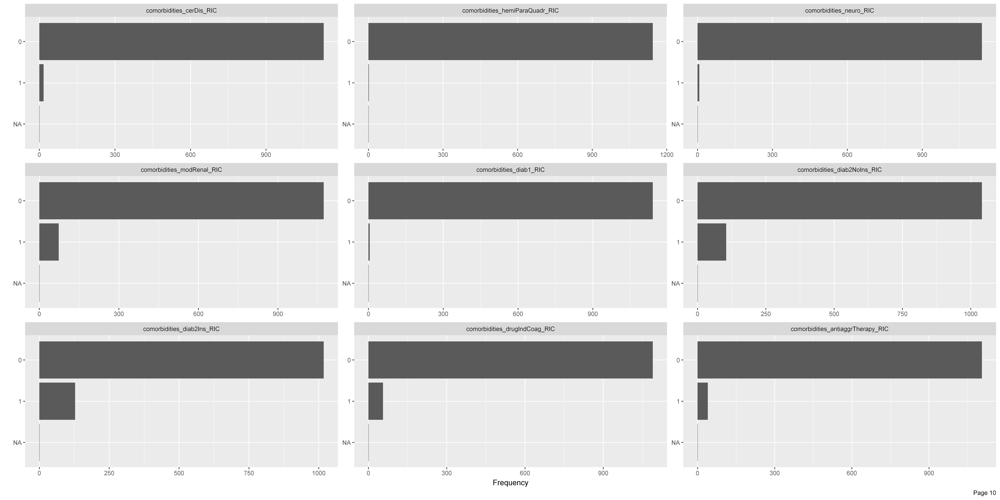

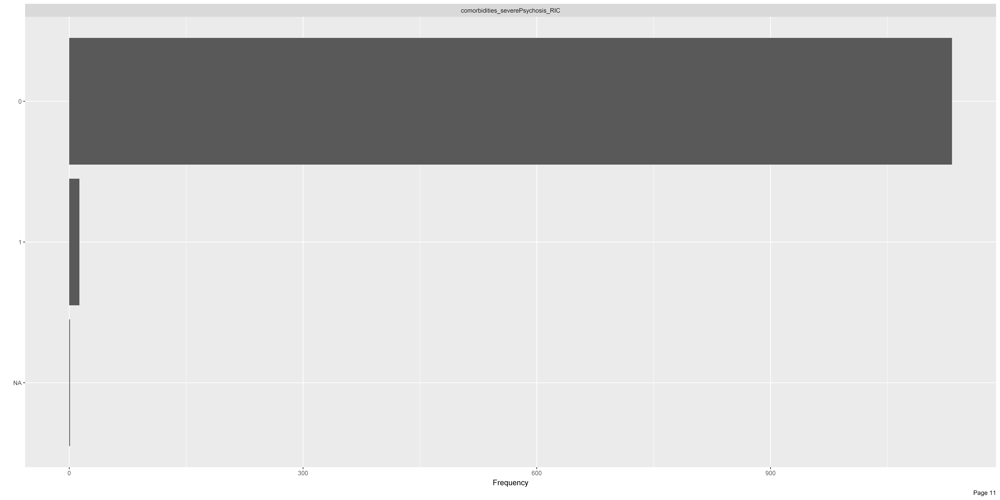

In [348]:
plot_bar(data = df)

Panoramica descrittiva su variabili continue fatta con istogrammi

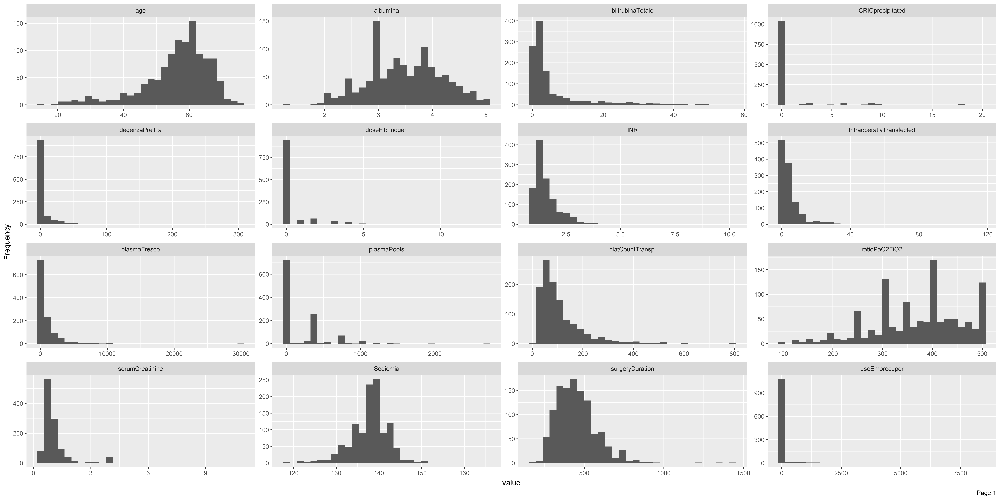

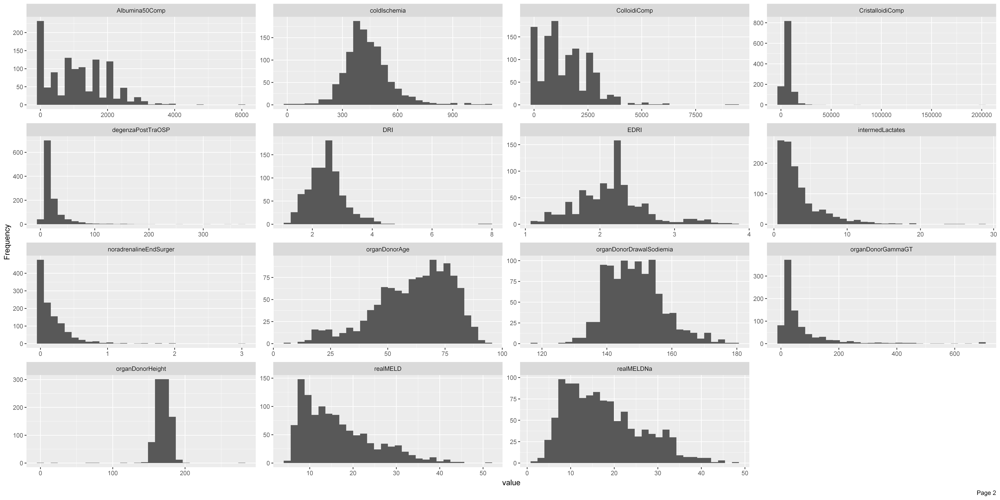

In [349]:
plot_histogram(data = df)

Controllo quanto sono schiacciate le variabili continue.
Se il coefficiente è maggiore di 0 allora la maggior parte dei valori sono inferiori alla media. La maggior parte dei valori si concentra quindi sul lato sinistro del grafico.
Se il coefficiente è uguale a 0 o vicino a 0, allora il grafico è simmetrico e i dati sono distribuiti normalmente.
Se il coefficiente è inferiore a 0, la maggior parte dei valori sono maggiori della media e la maggior parte dei valori si concentra sul lato destro del grafico.

In [350]:
apply(select_if(df,is.numeric), 2, skewness, na.rm = TRUE)

age            degenzaPreTra         bilirubinaTotale 
             -1.21211308               7.73121572               2.62981038 
                     INR          serumCreatinine                 Sodiemia 
              3.77508112               4.07083921              -0.46162500 
           ratioPaO2FiO2         platCountTranspl                 albumina 
             -0.45485565               2.43419195              -0.02617813 
         surgeryDuration IntraoperativTransfected             plasmaFresco 
              1.43809396               5.64222985               7.38560786 
             plasmaPools           doseFibrinogen         CRIOprecipitated 
              2.27923538               3.70674614               4.34663512 
           useEmorecuper         CristalloidiComp             ColloidiComp 
             11.29437294              17.69568272               1.19816536 
          Albumina50Comp   noradrenalineEndSurger         intermedLactates 
              0.68440180               3.65411518               2.60237155 
            coldIschemia            organDonorAge         organDonorHeight 
              1.01242313              -0.72480155              -4.25096822 
organDonorDrawalSodiemia        organDonorGammaGT                 realMELD 
              0.47870631               3.52526063               0.98650426 
              realMELDNa                      DRI                     EDRI 
              0.66123954               1.77120515               0.59689815 
       degenzaPostTraOSP 
              5.84322842

Viene vista nel dettaglio la variabile oggetto di studio, sia normalmente che attraverso una cumulativa

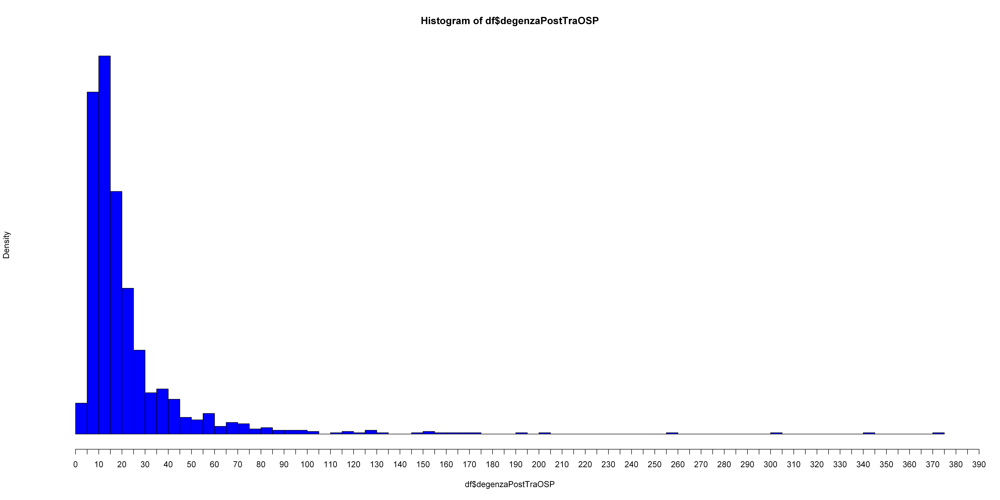

In [351]:
hist(df$degenzaPostTraOSP, freq = FALSE, axes= FALSE, breaks= 100,col="blue")

axis(1, at = seq(0, 400, by = 5))


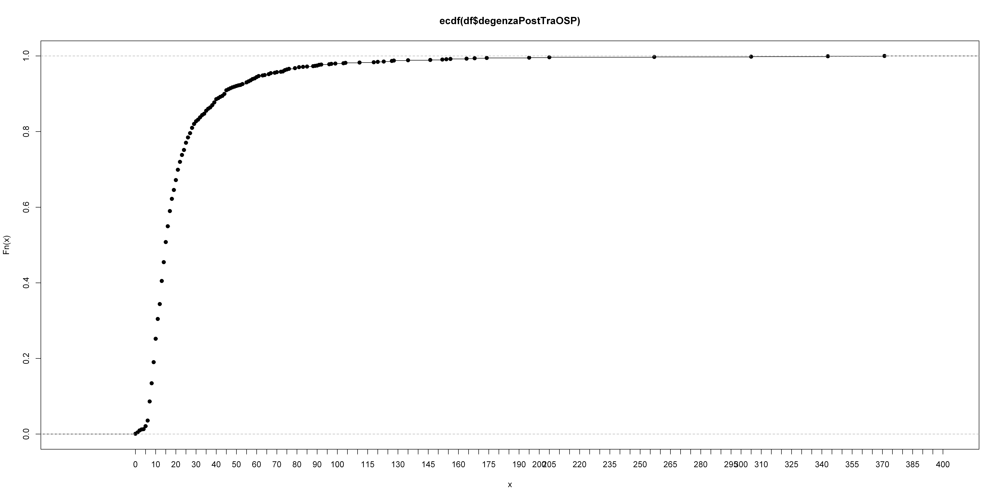

In [352]:
# calculate CDF 
CDF <- ecdf(df$degenzaPostTraOSP )
  
# draw the cdf plot
plot( CDF )
axis(1, at = seq(0, 400, by = 5))

Creazione di un dataframe temporaneo contenente solo le variabili numeriche per la creazione di un’heatmap che descrive la correlazione tra le variabili, escludendo la variabile oggetto. 

In [353]:
df_num <- select(df,is.numeric)

In [354]:
for(i in 1:ncol(df_num)) {
  df_num[ , i][is.na(df_num[ , i])] <- mean(df_num[ , i], na.rm = TRUE)
}

In [355]:
tmp <- cor(df_num) %>%
  as.data.frame() %>%
  mutate(var1 = rownames(.)) %>%
  gather(var2, value, -var1) %>%
  arrange(desc(value)) 

tmp <- tmp[tmp$value != 1,]

In [356]:
tmp <- tmp[!duplicated(tmp$value), ]

In [357]:
df_num <- subset(df_num,select = tmp[1:40,"var1"][!duplicated(tmp[1:40,"var1"])])

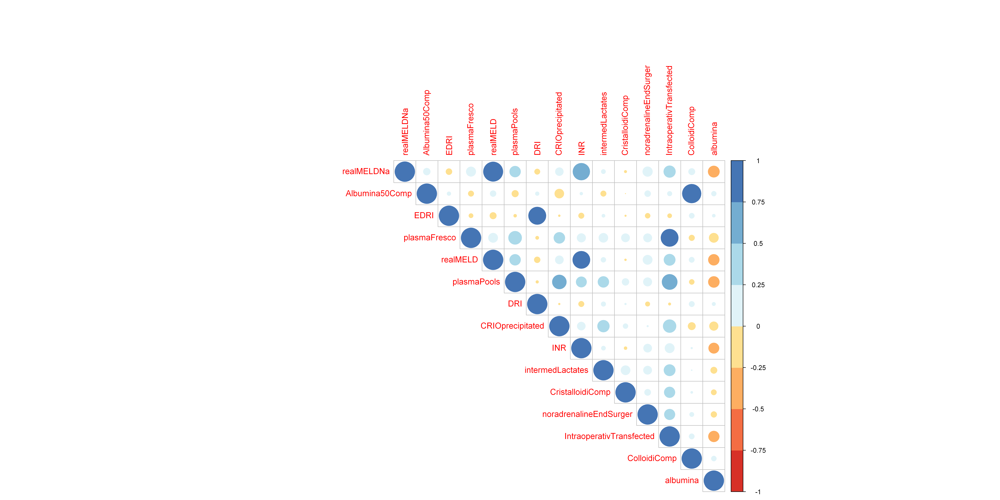

In [358]:


library(corrplot)
library(RColorBrewer)

M <-cor(df_num %>% 
          select(colnames(df_num)))

corrplot(M, type="upper", order = "original",col=brewer.pal(n=8, name="RdYlBu"))



Resoconto per variabili altamente correlate o inversamente correlate, nel primo caso vengono considerate le variabili con un coefficiente di correlazione maggiore di 0.5 mentre nel secondo minore di -0.5

In [359]:
tmp <- tmp[tmp$value> 0.5 | tmp$value < -0.5,]
tmp 

,var1,var2,value
32,realMELDNa,realMELD,0.9618895
34,Albumina50Comp,ColloidiComp,0.8921129
36,EDRI,DRI,0.7762424
38,plasmaFresco,IntraoperativTransfected,0.7652436
40,realMELD,bilirubinaTotale,0.7594394
42,realMELD,INR,0.7587397
44,realMELDNa,bilirubinaTotale,0.7248959
46,realMELDNa,INR,0.7225938
48,plasmaPools,IntraoperativTransfected,0.5962432
50,EDRI,organDonorAge,0.5569137


Uso dataframe con variabili numeriche per vedere la correlazione tra tutte le variabili e la variabile oggetto, l’ordine delle variabili è da quella con il coefficiente più alto a quella con il coefficiente più basso

In [360]:
#correlations with objective variable

df_num <- select(df, is.numeric)

data_cor <- cor(df_num[ , colnames(df_num) != "degenzaPostTraOSP"],
                df_num$degenzaPostTraOSP, use = "complete.obs")

data_cor <- data_cor[order(data_cor[,1],decreasing=TRUE),]                                     

data_cor <- as.data.frame(data_cor)

data_cor

,data_cor
realMELD,0.2474272870
serumCreatinine,0.2401421187
realMELDNa,0.2391066139
degenzaPreTra,0.1621447613
noradrenalineEndSurger,0.1602670675
bilirubinaTotale,0.1571196123
Albumina50Comp,0.1466264835
ColloidiComp,0.1461184032
plasmaPools,0.1457202230
IntraoperativTransfected,0.1456894790


Sistemo variabile per la quale sono presenti 8 valori negativi generati probabilmente per errore, la formula con cui ho creato in precedenza la variabile CristalloidiComp utilizzata anche nei report dovrebbe essere corretta sentendo anche il parere di Skurzak.

In [361]:
df <- df[df$CristalloidiComp >= 0,] # there are negative values (8) 

Viene effettuato un plot che rappresenta i missing value per ogni variabile presente nel dataset, se la variabile non è presente allora i missing value sono pari a 0

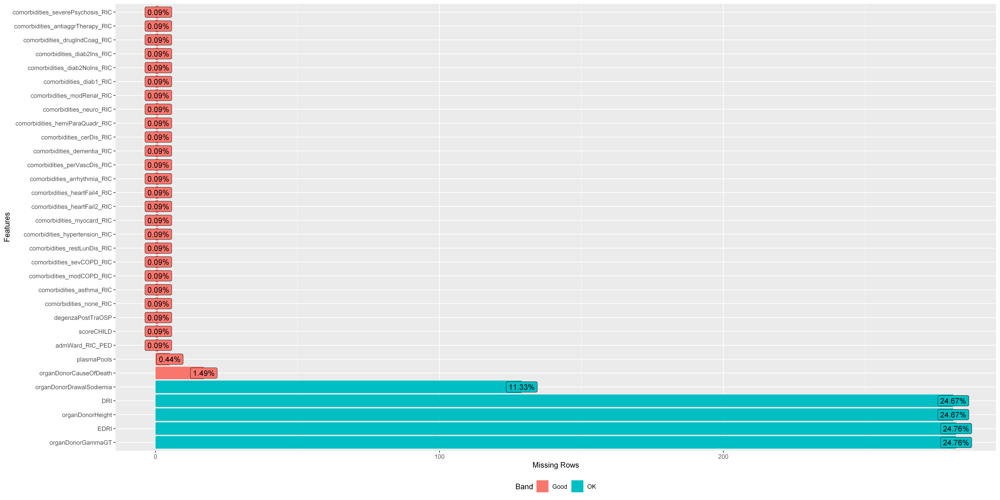

In [362]:
plot_missing(data = df,missing_only = TRUE)



# Data preparation

Nella fase di data preparation per prima cosa vengono eliminati i record in cui non è presente un valore per la variabile oggetto

In [363]:
df <- df[!is.na(df$degenzaPostTraOSP),] # delete records with NA value in objective variable

Vengono eliminati i record che presentano epatite fulminante e cirrosi epatica acuta in quanto essi presentano caratteristiche molto diverse dal resto della popolazione analizzata

In [364]:
df <- df[!(df$liverDisords_hepatFulm %in% 1)
          & !(df$liverDisords_subAcute %in% 1) ,]   # deleting retransplant, fulminant hepatitis, acute liver failure

df <- subset(df, select= -c(liverDisords_hepatFulm,liverDisords_subAcute,prevLiverTransplant))

Vengono eliminati anche i pazienti che presentano più trapianti durante la stessa degenza per gli stessi motivi di prima

In [365]:
# deleting combined transplant patients

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2018/tabellaUM_OT.Rdata")

OT1 <- tabellaUM_OT
rm(tabellaUM_OT)


patients_rem <- c()


patients1 <- OT1[ OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT1_rem <- OT1[!OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients1){
    if (i %in% OT1_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}



load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2019/tabellaUM_OT.Rdata")

OT2 <- tabellaUM_OT
rm(tabellaUM_OT)


patients2 <- OT2[ OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT2_rem <- OT2[!OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients2){
    if (i %in% OT2_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2020/tabellaUM_OT.Rdata")

OT3 <- tabellaUM_OT
rm(tabellaUM_OT)

patients3 <- OT3[ OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT3_rem <- OT3[!OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients3){
    if (i %in% OT3_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2021/tabellaUM_OT.Rdata")

OT4 <- tabellaUM_OT
rm(tabellaUM_OT)

patients4 <- OT4[ OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT4_rem <- OT4[!OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients4){
    if (i %in% OT4_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


df <- (df[!(df$patientKey %in% patients_rem),])



creo epoche storiche di 6 mesi utilizzando la variabile riguardante la data per tenere conto dei cambiamenti nelle pratiche cliniche e organizzative durante i periodi considerati

In [366]:
df <-  df %>%  
  mutate(Periodi_trap = case_when(
    icuAdmDate__icuAdmDate > "2018-01-01" & icuAdmDate__icuAdmDate <= "2018-12-31" ~ 1,
    icuAdmDate__icuAdmDate >= "2019-01-01" & icuAdmDate__icuAdmDate < "2019-06-30" ~ 2,
    icuAdmDate__icuAdmDate >= "2019-06-30" & icuAdmDate__icuAdmDate <= "2019-12-31" ~ 3,
    icuAdmDate__icuAdmDate >= "2020-01-01" & icuAdmDate__icuAdmDate < "2020-06-30" ~ 4,
    icuAdmDate__icuAdmDate >= "2020-06-30" & icuAdmDate__icuAdmDate <= "2020-12-31" ~ 5,
    icuAdmDate__icuAdmDate >= "2021-01-01" & icuAdmDate__icuAdmDate < "2021-06-30" ~ 6,
    icuAdmDate__icuAdmDate >= "2021-06-30" & icuAdmDate__icuAdmDate <= "2021-12-31" ~ 7,
    icuAdmDate__icuAdmDate >= "2022-01-01" & icuAdmDate__icuAdmDate < "2022-08-30" ~ 8))

df$Periodi_trap <- as.factor(df$Periodi_trap)

df <- subset(df, select = -icuAdmDate__icuAdmDate)

Creo variabile binaria con l’utilizzo dell’orario dell’ammissione in terapia intensiva. Questa variabile indica se il trapianto è stato effettuato di notte o no. Per notte è considerato il periodo mezzanotte 11 mentre per giorno il resto

In [367]:
df$trap_notturno <- ifelse( df$icuAdmDate__icuAdmTime <= 11 & df$icuAdmDate__icuAdmTime >= 0, 1 , 0)

df$trap_notturno <- as.factor(df$trap_notturno)

df <- subset(df, select = -icuAdmDate__icuAdmTime)

Con i consigli di Skurzak ho creato una nuova variabile per quanto riguarda il reparto di provenienza andando ad eliminare la vecchia variabile

In [368]:
df <- df %>%  
  mutate(new_admWard = case_when(      
      degenzaPreTra <= 1 ~ "HOME",
      degenzaPreTra > 1 & (admWard_RIC_PED == "medicalWard" | admWard_RIC_PED == "surgicalWard") ~ "WARD",
      degenzaPreTra > 1 & (admWard_RIC_PED == "otherIcu" | admWard_RIC_PED == "emergRoom" | admWard_RIC_PED == "highDep") ~ "ICU"))


df$new_admWard <- as.factor(df$new_admWard)

df <- subset(df, select = -admWard_RIC_PED)

Creazione di altra variabile andando a combinare portosystEncephalPresent, frequency e degree sempre su suggerimento da parte di Skurzak

In [369]:
df <-  df %>% 
  mutate(EPScum = case_when(portosystEncephalPresent == "respNo" ~ 0,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Episodic" & (degree == "degreeI" |degree == "degreeII"))~ 1,
                            (portosystEncephalPresent == "respEffect" & frequency == "Episodic" & (degree == "degreeI" |degree == "degreeII"))~ 2,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Episodic" & (degree == "degreeIII" |degree == "degreeIV"))~ 3,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Appellant" & (degree == "degreeI" |degree == "degreeII"))~ 4,
                            (portosystEncephalPresent == "respEffect" & frequency == "Persistent" & (degree == "degreeI" |degree == "degreeII"))~ 5,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Appellant" & (degree == "degreeIII" |degree == "degreeIV"))~ 6,
                            (portosystEncephalPresent == "respEffect" & frequency == "Episodic" & (degree == "degreeIII" |degree == "degreeIV"))~ 7,
                            (portosystEncephalPresent == "respEffect" & frequency == "Persistent" & (degree == "degreeIII" |degree == "degreeIV"))~ 8))

df <- subset(df, select = - c(portosystEncephalPresent,frequency,degree))

df$EPScum <- as.factor(df$EPScum)

Anche qui modifica alla variabile organDonorMaastricht sempre seguendo i consigli dati da Skurzak

In [370]:
df$organDonorMaastricht <- ifelse( df$organDonorMaastricht == "classI" | df$organDonorMaastricht == "classIV"
                                        | df$organDonorMaastricht == "classV", "class_other" , df$organDonorMaastricht)

df$organDonorMaastricht <- as.factor(df$organDonorMaastricht)

Viene fatto raggruppamento variabili che riguardano le tipologie epatiche. Il raggruppamento viene fatto perchè le variabili a scelta multipla che hanno una bassissima varianza quindi diminuendo il livello di dettaglio si rende la variabile più utile per la fase successiva. Le categorie create sono: colestatiche, rare, virali e tumore

In [371]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

Stessa cosa viene fatta con le comorbidità. Qui le categorie create sono: respiratorie, cardiovascolari, neurologiche, renali, endocrine e scoagulazione. Sia in questo caso che in quello precedente con le patologie epatiche vengono poi eliminate le variabili che compongono i vari gruppi e viene resa factor la variabile appena creata.

In [372]:
#respiratorie

df <- df %>% 
    mutate(comorbidities_respiratorie = ifelse( comorbidities_asthma_RIC == 1 | comorbidities_modCOPD_RIC == 1 |
                                               comorbidities_sevCOPD_RIC == 1 | comorbidities_restLunDis_RIC == 1 |
                                               oxygenTherapy == "responsYes", 1, 0))

df$comorbidities_respiratorie <- as.factor(df$comorbidities_respiratorie)
df <- subset(df, select = -c(comorbidities_asthma_RIC,comorbidities_modCOPD_RIC, comorbidities_sevCOPD_RIC, 
                             comorbidities_restLunDis_RIC, oxygenTherapy ))






#cardiovascolari

df <- df %>% 
    mutate(comorbidities_cardiovascolari = ifelse( comorbidities_myocard_RIC == 1 | comorbidities_heartFail2_RIC == 1 |
                                               comorbidities_heartFail4_RIC == 1 | comorbidities_arrhythmia_RIC == 1 |
                                               comorbidities_perVascDis_RIC == 1, 1, 0))

df$comorbidities_cardiovascolari <- as.factor(df$comorbidities_cardiovascolari)
df <- subset(df, select = -c(comorbidities_myocard_RIC,comorbidities_heartFail2_RIC, comorbidities_heartFail4_RIC, 
                             comorbidities_arrhythmia_RIC, comorbidities_perVascDis_RIC ))


#neurologiche

df <- df %>% 
    mutate(comorbidities_neurologiche = ifelse( comorbidities_dementia_RIC == 1 | comorbidities_cerDis_RIC == 1 |
                                               comorbidities_hemiParaQuadr_RIC == 1 | comorbidities_neuro_RIC == 1 , 1, 0))

df$comorbidities_neurologiche <- as.factor(df$comorbidities_neurologiche)
df <- subset(df, select = -c(comorbidities_dementia_RIC,comorbidities_cerDis_RIC, comorbidities_hemiParaQuadr_RIC, 
                             comorbidities_neuro_RIC))


#renali

df <- df %>% 
    mutate(comorbidities_renali = ifelse( comorbidities_modRenal_RIC == 1 | comorbidities_modRenal_RIC == 1, 1, 0))

df$comorbidities_renali <- as.factor(df$comorbidities_renali)
df <- subset(df, select = -c(comorbidities_modRenal_RIC,comorbidities_modRenal_RIC))


#endocrine

df <-  df %>% 
  mutate(comorbidities_diabete = case_when(comorbidities_diab2NoIns_RIC == 1 ~ 1,
  comorbidities_diab1_RIC == 0 & comorbidities_diab2Ins_RIC == 0 & comorbidities_diab2NoIns_RIC == 0 ~ 0,
  comorbidities_diab1_RIC == 1 |comorbidities_diab2Ins_RIC == 1 ~ 2))

df$comorbidities_diabete <- as.factor(df$comorbidities_diabete)
df <- subset(df, select= - c(comorbidities_diab1_RIC,comorbidities_diab2Ins_RIC,comorbidities_diab2NoIns_RIC))

#scoagulazione

df <- df %>% 
    mutate(comorbidities_scoagulazione = ifelse( comorbidities_drugIndCoag_RIC == 1 |
                                                comorbidities_antiaggrTherapy_RIC == 1 , 1, 0))

df$comorbidities_scoagulazione <- as.factor(df$comorbidities_scoagulazione)
df <- subset(df, select = -c(comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC))

Sempre seguendo le indicazioni di Skurzak viene creata una variabile binaria MELDEXCEPTION che è pari a 1 se è presente una tra ipertensione polmonare e sindrome epatopolmonare, altrimenti 0. Quest'utltime due variabili vengono eliminate

In [373]:
df <- df %>% 
    mutate(MELDEXCEPTION = ifelse( pulmonarHypertension == "responsYes" |
                                                epatopulmonarSyndrome == "responsYes" , 1, 0))

df$MELDEXCEPTION <- as.factor(df$MELDEXCEPTION)
df <- subset(df, select = -c(pulmonarHypertension,epatopulmonarSyndrome))

Viene modificata la variabile intraoperativeTransfected andando a dividere l’emorecupero per 350 e poi viene sommato il valore originale di intraoperativeTransfected, emorecuper viene infine eliminato

In [374]:
df <- df %>% mutate(IntraoperativTransfected = (useEmorecuper / 350) + IntraoperativTransfected )

df <- subset(df, select = -useEmorecuper)

Elimino la variabile patientKey in quanto priva di informazioni e rendo factor centreCode in modo da poterlo passare ai modelli dato che lo dava come character 

In [375]:
df <- subset(df, select = -patientKey)
df$centreCode <- as.factor(df$centreCode)

Viene aggiunta nella variabile oggetto (degenza ospedaliera post trapianto) una penalità nel caso in cui il paziente sia deceduto. Questa penalità è pari al 90esimo percentile (44 giorni)

In [376]:
tmp <- unname(unlist(quantile(df$degenzaPostTraOSP, probs = c(0.9))))
df <- df %>% mutate(degenzaPostTraOSP = case_when(hospOutcome_RIC  %in% "hospDead" ~ tmp,
                                                  icuMortality %in% 1 ~ tmp,
                                                  TRUE ~ degenzaPostTraOSP))  #add penalty in degenzaPostTraOSP for patients who died

Vado a discretizzare la variabile oggetto in modo da poter utilizzare i modelli di classificazione. La discretizzazione è stata decisa da Skurzak. Per il periodo 0-8 giorni è stata assegnata la classe ottimo, per degenze da 8 a 18 giorni la classe accettabile, infine degenze maggiori di 18 giorni complicato. Elimino le variabili riguardanti la mortalità in quanto non più utili per lo studio

In [377]:
df$deg_cat <- cut(df$degenzaPostTraOSP ,breaks=c(0,8,Inf))

df <- df %>% mutate(deg_cat = case_when(deg_cat == levels(df$deg_cat)[1] ~ "fast",     # discretize objective variable
                                      deg_cat == levels(df$deg_cat)[2] ~ "NotFast"))

df$deg_cat <- as.factor(df$deg_cat)

df <- subset(df, select = -c(hospOutcome_RIC,icuMortality))

In [378]:
table(df$deg_cat)


   fast NotFast 
    140     919 

Elimino EDRI, DRI, ColloidiComp, realMELDNa, serumCreatinine, INR e bilirubinaTotale perchè sono le variabili fortemente correlate o dipendenti ad altre variabili che ho mantenuto. Ad esempio bilirubinaTotale, INR e serumCreatinine sono variabili utilizzate nella formula per il calcolo del MELD.
Nelle variabili altamente correlate ho preferito mantenere tra le due quella con una distributzione meno schiacciata rispetto all’altra

In [379]:
df <- subset(df, select = - c(EDRI,DRI,ColloidiComp,realMELDNa,
                              serumCreatinine,INR,bilirubinaTotale)) #delete high correlated variables and dependent variables

Rimuovo le colonne che hanno più del 50% di missing value

In [380]:
df <- df[lapply(df, function(x) sum(is.na(x))/length(x)) < 0.50] #remove column with more than 50% of NA

Plotto una descrittiva delle variabili modificate o appena create

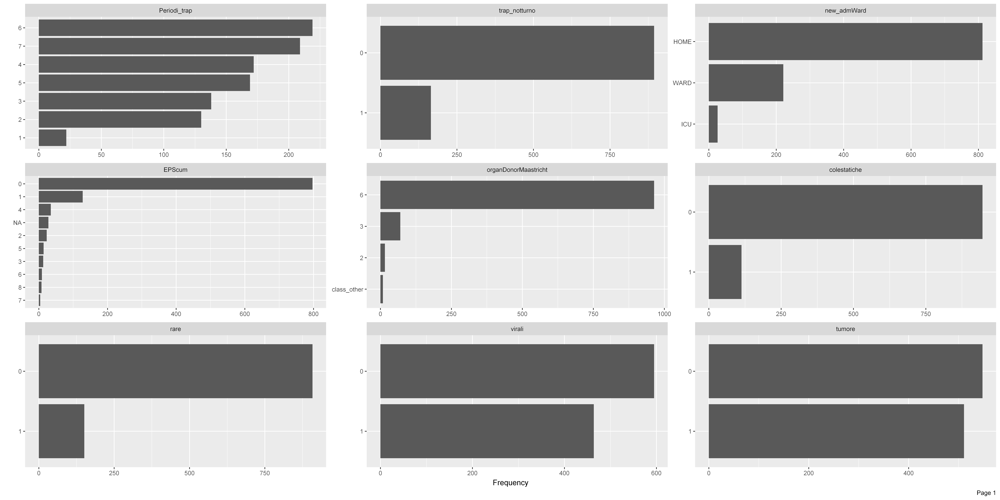

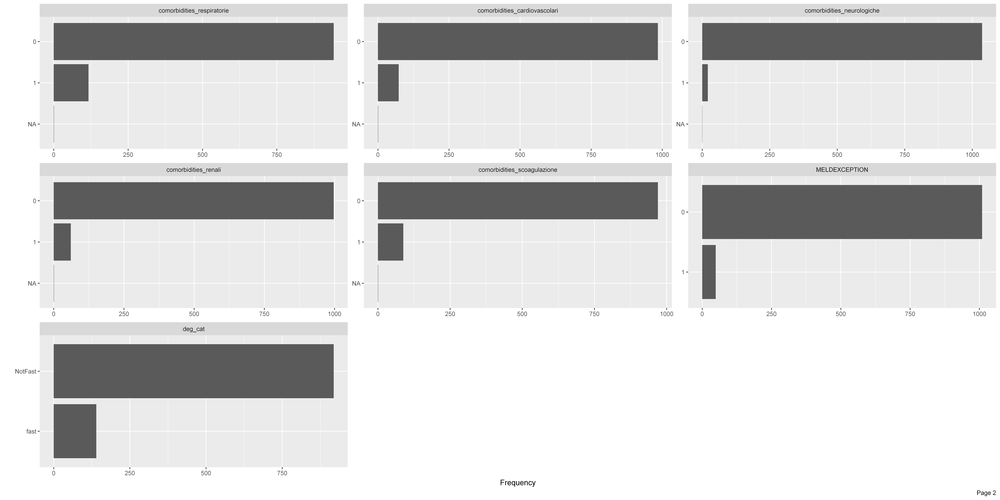

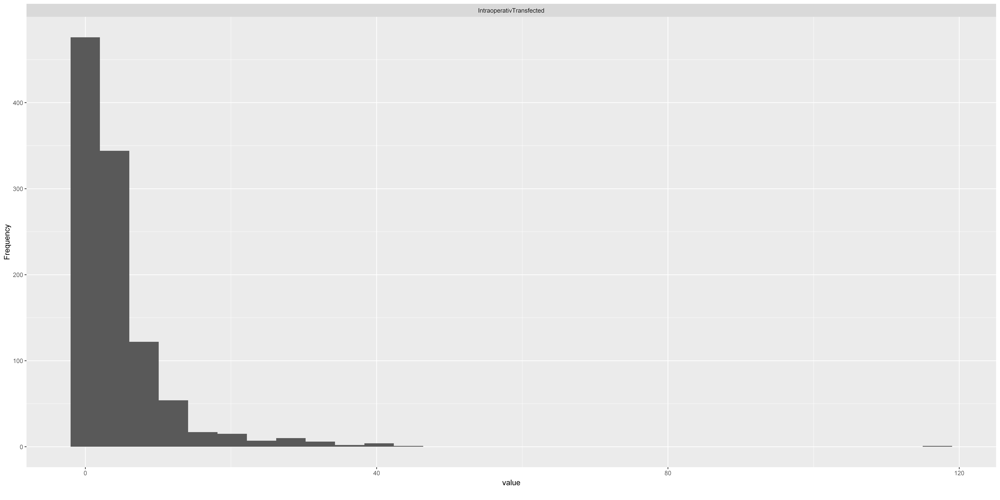

In [381]:
nuove_descrittiva <- subset(df, select= c(Periodi_trap,trap_notturno,new_admWard,EPScum,organDonorMaastricht,colestatiche,rare,virali,tumore,
comorbidities_respiratorie,comorbidities_cardiovascolari,comorbidities_neurologiche,comorbidities_renali,
comorbidities_scoagulazione,MELDEXCEPTION,deg_cat,IntraoperativTransfected))


plot_bar(data = nuove_descrittiva)

plot_histogram(data = nuove_descrittiva)

Numero totale per tipologia di variabile dopo la fase preparazione dati

In [382]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length) # tipo variabili dopo data preparation

Group.1,x
factor,56
numeric,23


# Preprocessing

Vengono imputati i missing value tramite la funzione missforest. Questa funzione esegue l'imputazione dei dati utilizzando l'algoritmo random forest, il quale utilizza una serie di alberi decisionali per prevedere il valore mancante basandosi sui valori presenti nel dataset.

In [383]:
library(missForest)

df_imp <- missForest(df)       # fill NA

df <- df_imp$ximp

df_imp <- missForest(df)

df <- df_imp$ximp

Attraverso la funzione preProcess applico 4 tipi di trasformazione dei dati: i primi due, ossia center e scale fanno in modo che venga applicata una standardizzazione dei dati, infatti attraverso center si va a sottrarre la media dei valori di ogni variabile dai valori di ogni osservazione di quella variabile e ciò consente di traslare i valori di ogni variabile in modo che la loro media sia zero.
Attraverso il metodo scale invece vengono divisi i valori di ogni osservazione di una variabile per la deviazione standard di quella variabile e ciò consente di rendere i valori di ogni variabile compresi nello stesso intervallo, in questo caso tra -1 ed 1. Questa standardizzazione è utile perché può aiutare a rendere i dati più adatti a certi tipi di modelli di classificazione, come ad esempio il K-nearest neighbors che basa la sua classificazione sulla distanza tra le osservazioni. La standardizzazione consente di rendere tutte le variabili sulla stessa scala, rendendo così la distanza più significativa. Con il metodo boxcox, invece produce una trasformazione ottimale per rendere i dati più simili a una distribuzione normale, andando quindi a sistemare le variabili altamente schiacciate identificate nella fase di esplorazione dei dati. Infine con la funzione zv si vanno ad eliminare tutte le variabili che hanno varianza pari a 0 quindi prive di informazioni. Su questo ultimo punto si potrebbe usare anche il metodo nzv nel quale si indica un threshold per la varianza sotto la quale le variabili vengono eliminate

In [384]:
tmp <- df$degenzaPostTraOSP
df <- subset(df,select= -degenzaPostTraOSP)

preProc <- preProcess(df, method = c("center","scale","BoxCox","zv"))

df <- predict(preProc, df)

Creazione di un dataframe contenente solo variabili numeriche e in cui la variabile oggetto non è discretizzata per effettuare una regressione lineare

In [385]:
numerical_cols <-  df %>%   
  select_if(is.numeric) %>%
  colnames()

df_num <- df %>% 
  select(all_of(numerical_cols))


df_num$degenzaPostTraOSP <- tmp

df_num$degenzaPostTraOSP <- log(df_num$degenzaPostTraOSP)


Salvataggio dataset da utilizzare nella fase di modellazione. df_finale per i modelli di classificazione e df_num_finale per la regressione lineare

In [386]:
df_finale <- df
df_num_finale <- df_num

save(df_finale, file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_finale.Rdata")
save(df_num_finale, file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_num_finale.Rdata")